# Imports

## Packages

In [1]:
import tensorflow as tf
from tensorflow.keras import optimizers, losses, metrics, layers, models, callbacks
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tqdm
import transformers
from sklearn.model_selection import train_test_split as tts
import nltk
import re

from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)

E:\Anaconda3\envs\py310-gpu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<IPython.core.display.Javascript object>

## Helper Funcs

In [2]:
def punc_remover(text):
    return re.sub(r'[^\w\s]', '', text)

## Data

In [3]:
df_train = pd.read_csv('DATA/Arman_Emo_train.tsv', sep='\t', header=None)
df_train.columns = ['Text', 'Class']
df_test = pd.read_csv('DATA/Arman_Emo_test.tsv', sep='\t', header=None)
df_test.columns = ['Text', 'Class']

df = pd.concat([df_train,df_test])
## cleaning punctuations
#df.Text = df.Text.apply(punc_remover)

In [4]:
df

Text  Class
0     خیلی کوچیک هستن و سایزشون بدرد نمیخوره میخوام ...    SAD
1        از صدای پرنده دم دمای صبح متنفرم متنفرم متنفرم   HATE
2      "کیفیتش خیلی خوبه با شک خریدم ولی واقعا راضیم...    SAD
3     چون همش با دوربین ثبت شده ، ایا میشه اعتراض زد...  OTHER
4                 اين وضع ب طرز خنده داري گريه داره ...    SAD
...                                                 ...    ...
1146  یعنی این آهنگ مرغ سحر جوری ساخته شده و روی این...  HAPPY
1147  درود بر همه ایرانیان شریف که در این سرما در تظ...  HAPPY
1148  امروز تولدم است،عید است ولی شاد نیستم،عید و تو...    SAD
1149               لعنت به اونی که دلتنگ نگهت میداره...    SAD
1150  من در شگفت انگیز و قبل از بالا رفتن قیمت ها به...  HAPPY

[7276 rows x 2 columns]

In [5]:
df_train, df_test = tts(df, test_size=0.2, random_state=123)

In [6]:
df_train

Text  Class
2120  ترس هايی كه با ان روبرو نمی شويد محدوديت های ش...   FEAR
1458  امروز اگه تنها بودم خودکشی میکردم، از خودم متنفرم   HATE
244   چرا هیچ وقت از این بسیجی ها به پست ما نمیخوره ...  ANGRY
524                        بخند دیوونه کی دیده غم بمونه  HAPPY
722   سلفیان برای اموات شان هیچ مراسمی نمیگیرند! نما...    SAD
...                                                 ...    ...
5218                                خدانکنه که   عزیزی   OTHER
4060  حالا ایتالیا بهتره شهر ری عه؟حتی شعور ماسک زدن...   HATE
1346  میشه تو چیزی که تخصص نداری حرف الکی نزنی و بشی...  ANGRY
3454   "من حدود دو ساله که دارمش عالیه#روز_دختر روزی...    SAD
3582  تحقیری در کار نیست دوست من، من از اینکار بیزار...   HATE

[5820 rows x 2 columns]

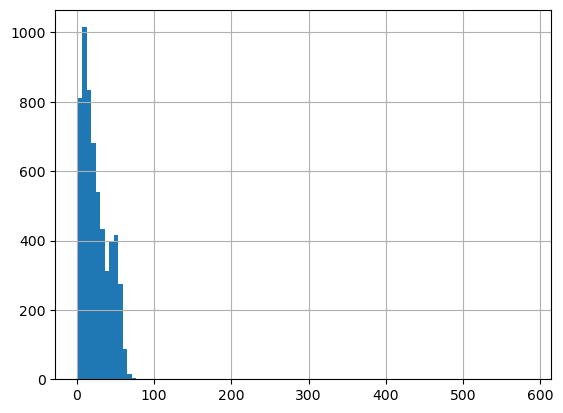

In [7]:
df_train.Text.apply(lambda x:len(x.split(' '))).hist(bins=100)
plt.show()

# Models

## ParsBERT_Huggingface_Classifier

In [8]:
checkpoint = 'HooshvareLab/bert-base-parsbert-uncased'

In [9]:
# class myTokenizerLayer(layers.Layer):
#     def __init__(self, checkpoint):
#         super(myTokenizerLayer, self).__init__()
#         self.checkpoint = checkpoint
        
#     def call(self, Texts):
#         def _tokenizer(Texts, checkpoint):
#             Texts = Texts.tolist()
#             decoded = [i.decode('utf-8') for i in Texts]
            
#             tokenizer = transformers.AutoTokenizer.from_pretrained(checkpoint)
#             tokens = tokenizer(decoded, return_tensors='np', padding=True)
#             #print(tokens)
#             #tokens = list(dict(tokens).values())
#             #print(tokens)
#             return tokens
        
#         tokens = tf.numpy_function(_tokenizer, [Texts, self.checkpoint], [tf.int32])
#         tokens = {'input_ids':tokens[1], 'token_type_ids':tokens[2], 'attention_mask':tokens[0]}
#         print(tokens)
#         return tokens
            

### Data preprocess

In [10]:
name2class = {name:i for i, name in enumerate(df_train.Class.sort_values().unique())}
class2name = {i:name for name,i in name2class.items()}
print(name2class)
print(class2name)

{'ANGRY': 0, 'FEAR': 1, 'HAPPY': 2, 'HATE': 3, 'OTHER': 4, 'SAD': 5, 'SURPRISE': 6}
{0: 'ANGRY', 1: 'FEAR', 2: 'HAPPY', 3: 'HATE', 4: 'OTHER', 5: 'SAD', 6: 'SURPRISE'}


In [11]:
tokenizer = transformers.AutoTokenizer.from_pretrained(checkpoint)

X_train = tokenizer(
    df_train.Text.values.tolist(), 
    return_tensors='np', 
    truncation=True, padding='max_length', 
    max_length=64
)

X_test = tokenizer(
    df_test.Text.values.tolist(),
    return_tensors='np',
    truncation=True,
    padding='max_length',
    max_length=64
)

y_train = tf.one_hot(df_train.Class.map(name2class).values, 7)
y_test = tf.one_hot(df_test.Class.map(name2class).values, 7)

### Get Model from HuggingFace

In [12]:
tf.keras.backend.clear_session()

model = transformers.TFAutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels=7)
model.compile(optimizer = optimizers.Adam(0.00005), 
              loss = losses.CategoricalCrossentropy(from_logits=True),
              metrics = [metrics.CategoricalAccuracy(), metrics.Precision()]
             )

All model checkpoint layers were used when initializing TFBertForSequenceClassification.

Some layers of TFBertForSequenceClassification were not initialized from the model checkpoint at HooshvareLab/bert-base-parsbert-uncased and are newly initialized: ['classifier']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [13]:
model.summary()

Model: "tf_bert_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bert (TFBertMainLayer)      multiple                  162841344 
                                                                 
 dropout_37 (Dropout)        multiple                  0 (unused)
                                                                 
 classifier (Dense)          multiple                  5383      
                                                                 
Total params: 162,846,727
Trainable params: 162,846,727
Non-trainable params: 0
_________________________________________________________________


### Training

In [14]:
cb = [
    callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='loss', patience=5, factor=0.2, min_delta=0.01)
]

In [15]:
history = model.fit( 
    dict(X_train),
    y_train,
    batch_size=16,
    epochs=40,
    callbacks=cb,
    validation_data=(dict(X_test),y_test),
    validation_batch_size=16,
)

Epoch 1/40
364/364 [==============================] - 61s 137ms/step - loss: 1.1811 - categorical_accuracy: 0.5692 - precision: 0.3826 - val_loss: 1.0198 - val_categorical_accuracy: 0.6490 - val_precision: 0.4169 - lr: 5.0000e-05
Epoch 2/40
364/364 [==============================] - 49s 134ms/step - loss: 0.6604 - categorical_accuracy: 0.7756 - precision: 0.4522 - val_loss: 1.0434 - val_categorical_accuracy: 0.6401 - val_precision: 0.3726 - lr: 5.0000e-05
Epoch 3/40
  3/364 [..............................] - ETA: 45s - loss: 0.3552 - categorical_accuracy: 0.8750 - precision: 0.4608

KeyboardInterrupt: 

In [48]:
#testing = df_train.Text.values.tolist()[:16]
testing = 'چه خبره گذاشتین رو سرتون'
testing = dict(tokenizer(testing, return_tensors='np', padding=True))
p = np.argmax(tf.nn.softmax(model.predict(testing)['logits']), axis=1)
p = pd.DataFrame(p, columns=['preds'])
p['Class'] = p.preds.map(class2name)
p

1/1 [==============================] - 0s 67ms/step


preds  Class
0      0  ANGRY

In [47]:
df_train

Text     Class
0     خیلی کوچیک هستن و سایزشون بدرد نمیخوره میخوام ...       SAD
1        از صدای پرنده دم دمای صبح متنفرم متنفرم متنفرم      HATE
2      "کیفیتش خیلی خوبه با شک خریدم ولی واقعا راضیم...       SAD
3     چون همش با دوربین ثبت شده ، ایا میشه اعتراض زد...     OTHER
4                 اين وضع ب طرز خنده داري گريه داره ...       SAD
...                                                 ...       ...
6120  مرحوم پیش بینی آبکی زیاد میکرد     مرحوم عجب آ...  SURPRISE
6121  کلا عین اعتقادات و توئیت زدناتون ... !!   در ق...     ANGRY
6122  خب وقتی میگی کسی بیاد مارو بگیره یارو ترس میکن...      FEAR
6123  همون هارو     مگه آهنگ جدیدای خواننده‌های دهه ...  SURPRISE
6124                            نیم دگیرش چطور حل نیشد      OTHER

[6125 rows x 2 columns]

In [107]:
tf.keras.backend.clear_session()
checkpoint = 'HooshvareLab/bert-base-parsbert-uncased'#'bert-base-cased' #HooshvareLab/bert-base-parsbert-uncased
tokenizer = transformers.AutoTokenizer.from_pretrained(checkpoint)
model = transformers.TFAutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels=3)
#model.layers[0].trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(3e-5),metrics=tf.keras.metrics.SparseCategoricalAccuracy(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

All model checkpoint layers were used when initializing TFBertForSequenceClassification.

Some layers of TFBertForSequenceClassification were not initialized from the model checkpoint at HooshvareLab/bert-base-parsbert-uncased and are newly initialized: ['classifier']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [108]:
model.summary()

Model: "tf_bert_for_sequence_classification"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bert (TFBertMainLayer)      multiple                  162841344 
                                                                 
 dropout_37 (Dropout)        multiple                  0 (unused)
                                                                 
 classifier (Dense)          multiple                  2307      
                                                                 
Total params: 162,843,651
Trainable params: 162,843,651
Non-trainable params: 0
_________________________________________________________________


In [109]:
df = pd.read_csv('DATA/Prep_data.csv')
df

Text  Score  Suggestion
0     این اولین تجربه من برای خرید ایفون هست   امروز...    100           1
1                        خرید این محصول رو توصیه میکنم      84           1
2     1 ساله این گوشی رو دارم   هیچ نقطه ضعفی ازش ند...     60           1
3     سلام خدمت دوستان این گوشی از همه نظر عالی  کیف...     96           1
4     سلام دوستانی که نگران شکستن صفحه نمایش هستند ا...     92           1
...                                                 ...    ...         ...
3256  کیفت ساختش خوبه تنوعش هم خوبه   فقط مشکلش اینه...     84           2
3257           خیلی خوب و به درد بخوره و اندازشم عالیه     100           1
3258  عالیه خیلی دوسش دارم قیمتش یه کم زیاده ولی به ...    100           1
3259  من این مینی فرز رو از دیحیکالا سفارش دادم و به...     84           1
3260  بعد از چند دقیقه که باهاش کار کنی سریع داغ میش...     48           3

[3261 rows x 3 columns]

In [110]:
X = df.Text.values.tolist()
y = df.Suggestion.values-1
#y = df.Score

X_train,X,y_train,y = tts(X,y,test_size=0.2)

X_train = tokenizer(X_train, return_tensors='np', padding='max_length', max_length=52, truncation=True)
X = tokenizer(X, return_tensors='np', padding='max_length', max_length=52, truncation=True)

In [114]:
callback = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', min_delta=0.01, patience=5)

In [115]:
model.fit(dict(X_train), y_train, validation_data=(dict(X), y),
          batch_size=32, validation_batch_size=32, epochs=40,
          callbacks=[callback]
         )


Epoch 1/40


KeyboardInterrupt: 

In [17]:
test = tokenizer('بی خصیت ت', return_tensors='np', padding='max_length', truncation=True, max_length=52)
np.argmax(tf.nn.softmax(model.predict(dict(test))['logits']),axis=1)

{'input_ids': array([[   2, 2063, 2036, 2363, 7809, 2063, 2341, 3470,    4,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0]]), 'token_type_ids': array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]]), 'attention_mask': array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]])}
1/1 [==============================] - 0s 129ms/step


array([[74.55451]], dtype=float32)

In [35]:
df.Text.values.tolist()[3260]

'بعد از چند دقیقه که باهاش کار کنی سریع داغ میشه که حتی برا تعویض کردن صفحه مجبورشدم بزارم سرد بشه البته از جنس چینی انتظار دیگه ای نمیره '

In [44]:
df.Suggestion.max()

3

In [10]:
transformers.TFAutoModel.from_config('bert-base-cased')

AttributeError: 'str' object has no attribute '_name_or_path'